In [123]:
import cv2
from matplotlib import pyplot as plt
import os 

In [124]:
#Q2.1
# Function to load an image in grayscale
def load_image(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img, gray

# Function to apply SIFT and detect keypoints and descriptors
def apply_sift(gray_img):
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray_img, None)
    return keypoints, descriptors

# Function to draw keypoints on the image
def draw_keypoints(img, keypoints):
    return cv2.drawKeypoints(img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Function to perform BruteForce matching
def brute_force_matching(descriptors1, descriptors2):
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(descriptors1, descriptors2)
    return sorted(matches, key=lambda x: x.distance)

# Function to perform FLANN-based matching and filter matches using the Lowe's ratio test
def flann_matching(descriptors1, descriptors2):
    index_params = dict(algorithm=1, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(descriptors1, descriptors2, k=2)
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append([m])
    return good_matches





In [125]:
# Paths to the images
image1_path = os.path.join('.','panaroma_generation', '1.jpg')
image2_path = os.path.join('.','panaroma_generation', '2.jpg')

original_img1 =  cv2.imread(image1_path)
original_img2 =  cv2.imread(image2_path)

# Load images
img1, gray1 = load_image(image1_path)
img2, gray2 = load_image(image2_path)

# Apply SIFT
keypoints1, descriptors1 = apply_sift(gray1)
keypoints2, descriptors2 = apply_sift(gray2)

# Draw keypoints on images
img1_keypoints = draw_keypoints(img1, keypoints1)
img2_keypoints = draw_keypoints(img2, keypoints2)



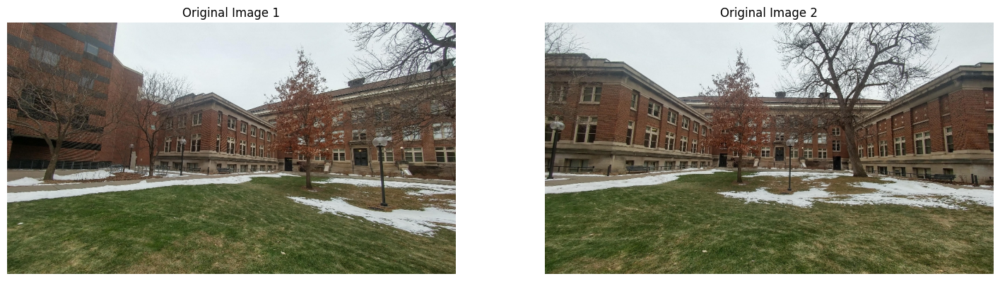

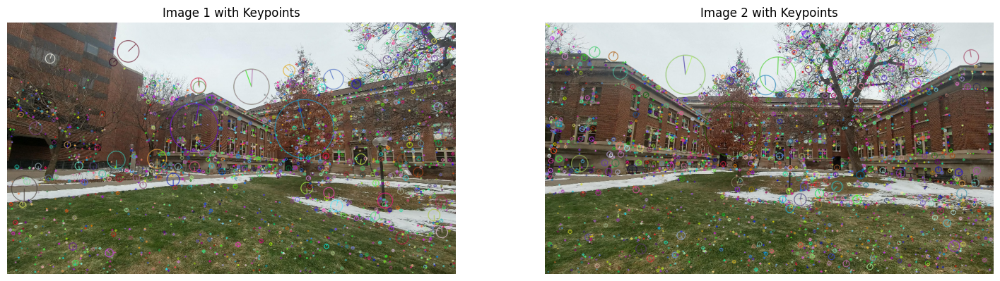

In [126]:


# # Plotting the original images and the images with keypoints
# fig, axs = plt.subplots(2, 2, figsize=(15, 12))

# # Original images
# axs[0, 0].imshow(cv2.cvtColor(original_img1, cv2.COLOR_BGR2RGB))
# axs[0, 0].set_title('Original Image 1')


# axs[0, 1].imshow(cv2.cvtColor(original_img2, cv2.COLOR_BGR2RGB))
# axs[0, 1].set_title('Original Image 2')

# Visualization
plt.figure(figsize=(18, 16))
plt.subplot(223)
plt.imshow(cv2.cvtColor(original_img1, cv2.COLOR_BGR2RGB))
plt.title('Original Image 1')
plt.axis('off')


# Visualization
# plt.figure(figsize=(18, 16))
plt.subplot(224)
plt.imshow(cv2.cvtColor(original_img2, cv2.COLOR_BGR2RGB))
plt.title('Original Image 2')
plt.axis('off')

plt.show()


# Visualization
plt.figure(figsize=(18, 16))
plt.subplot(221)
plt.imshow(cv2.cvtColor(img1_keypoints, cv2.COLOR_BGR2RGB))
plt.title('Image 1 with Keypoints')
plt.axis('off')

plt.subplot(222)
plt.imshow(cv2.cvtColor(img2_keypoints, cv2.COLOR_BGR2RGB))
plt.title('Image 2 with Keypoints')
plt.axis('off')

plt.show()



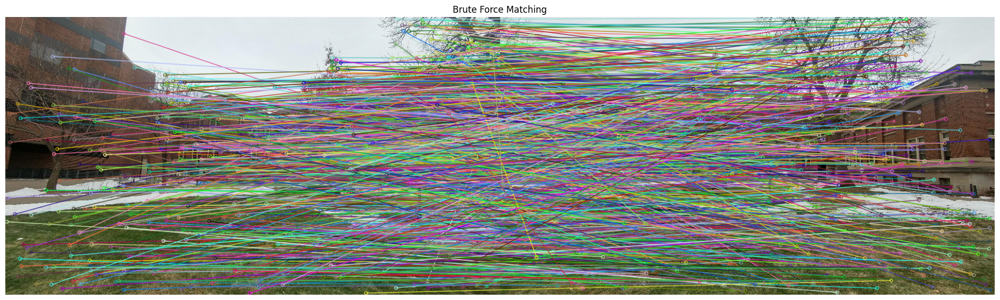

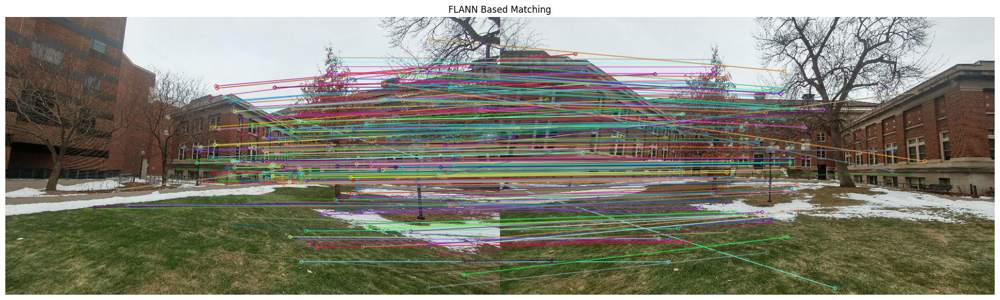

In [127]:
#Q2.2
# Perform matching
bf_matches = brute_force_matching(descriptors1, descriptors2)
flann_matches = flann_matching(descriptors1, descriptors2)

# Draw matches  WITH TOP 500 MATCHES between the two images as determined by the Brute Force algorithm, using the L2 norm.
bf_matched_img = cv2.drawMatches(img1, keypoints1, img2, keypoints2, bf_matches, None, flags=2)
flann_matched_img = cv2.drawMatchesKnn(img1, keypoints1, img2, keypoints2, flann_matches, None, flags=2)


plt.figure(figsize=(24, 24))
# plt.subplot(224)
plt.imshow(cv2.cvtColor(bf_matched_img, cv2.COLOR_BGR2RGB))
plt.title('Brute Force Matching')
plt.axis('off')

plt.show()

plt.figure(figsize=(24, 24))
# plt.subplot(222)
plt.imshow(cv2.cvtColor(flann_matched_img, cv2.COLOR_BGR2RGB))
plt.title('FLANN Based Matching')
plt.axis('off')

plt.show()

In [128]:
#Q2.3
import numpy as np

# # Function to compute homography using RANSAC
# def compute_homography(matches, kp1, kp2):
#     # Extract location of good matches
#     points1 = np.zeros((len(matches), 2), dtype=np.float32)
#     points2 = np.zeros((len(matches), 2), dtype=np.float32)

#     for i, match in enumerate(matches):
#         points1[i, :] = kp1[match.queryIdx].pt
#         points2[i, :] = kp2[match.trainIdx].pt

#     # Compute Homography
#     H, mask = cv2.findHomography(points1, points2, cv2.RANSAC)
#     return H, mask

def compute_homography(matches, kp1, kp2):
    if len(matches) < 4:
        return None, None

    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)

    for i, match in enumerate(matches):
        points1[i, :] = kp1[match.queryIdx].pt
        points2[i, :] = kp2[match.trainIdx].pt

    H, mask = cv2.findHomography(points1, points2, cv2.RANSAC)
    return H, mask


# Using the best matches from FLANN for homography calculation
if len(flann_matches) > 4:  # Minimum of 4 points is required to compute homography
    homography_matrix, inliers = compute_homography([m[0] for m in flann_matches if len(m) > 0], keypoints1, keypoints2)
    print("Homography Matrix:\n", homography_matrix)
    print("\nInliers Mask:\n", inliers.ravel())
else:
    print("Not enough matches are found - %d/%d" % (len(flann_matches), 4))




Homography Matrix:
 [[-4.05119121e+01  1.02312460e+00  1.46728389e+04]
 [-1.23282924e+01 -2.47239939e+01  7.63856416e+03]
 [-4.23882870e-02 -6.49211074e-04  1.00000000e+00]]

Inliers Mask:
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 1 0 0 1 1 0 1 1 0 1 1 1 1 0 0 1
 1 0 1 0 0 1 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 0
 1 1 1 1 0 0 0 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 0 0 1 0 1 1 0 1 1 1 0 1 1 1
 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1 1 0 0 1 1 1
 1 0 1 1 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 0 0 1 1 1 0 1 0
 0 0 1 0 1 0 1 0 0 1 1 1 1 1 0 1 1 1 1 1 0 0 0 0 0 1 0 1 1 1 1 1 0 0 1 0 1
 1 1 0 1 1 0 1 1 1 0 1 0 1 1 1 1 0 0 0 1 1 0 0 1 0]


In [129]:
# Using the best matches from Brute Force for homography calculation
if len(bf_matches) > 4:  # Minimum of 4 points is required to compute homography
    bf_homography_matrix, bf_inliers = compute_homography(bf_matches, keypoints1, keypoints2)
    print("Brute Force Homography Matrix:\n", bf_homography_matrix)
    print("\nBrute Force Inliers Mask:\n", bf_inliers.ravel())
else:
    print("Not enough matches are found - %d/%d" % (len(bf_matches), 4))



Brute Force Homography Matrix:
 [[-6.80990623e+01  1.45362419e+00  2.45788405e+04]
 [-2.05919598e+01 -4.22170887e+01  1.28122833e+04]
 [-7.04686127e-02 -2.02201087e-03  1.00000000e+00]]

Brute Force Inliers Mask:
 [1 0 1 0 0 1 1 0 1 1 1 1 1 0 1 1 1 1 1 0 1 1 0 0 1 1 0 1 0 1 1 0 0 1 1 0 0
 1 1 0 1 0 1 0 0 1 1 1 1 0 1 0 1 1 0 1 0 0 1 0 1 1 1 1 0 0 0 1 1 0 0 0 1 0
 0 1 1 1 0 1 1 0 1 1 0 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 0 0 0 0 1 1 1 1
 0 1 0 1 1 1 0 1 0 0 1 0 0 1 1 1 1 1 0 0 0 1 0 1 0 0 1 0 0 1 1 0 0 0 0 0 1
 1 0 0 1 1 0 1 1 1 1 0 0 1 0 1 1 1 0 1 1 1 1 0 1 0 1 0 1 0 1 0 0 1 1 0 1 0
 1 1 1 0 1 0 1 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 1 1 0 1 0
 1 0 0 1 1 0 1 1 1 0 1 0 0 0 0 1 0 1 0 0 0 1 0 1 1 1 1 0 1 0 0 1 0 0 1 0 0
 1 0 0 0 1 0 1 1 1 0 1 1 1 0 0 0 0 0 0 1 0 1 0 1 1 0 0 1 0 0 0 1 1 1 1 1 1
 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 0 0 1 1 0 0
 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 1 1 1 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 1 0 0 0 0 1 1 0 0 0 1 0 1 0 1

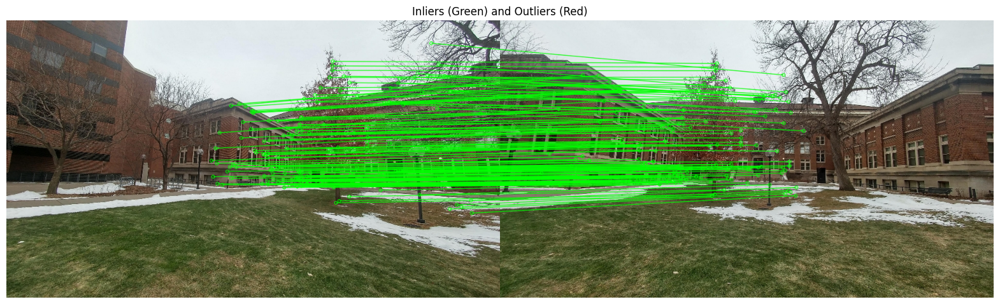

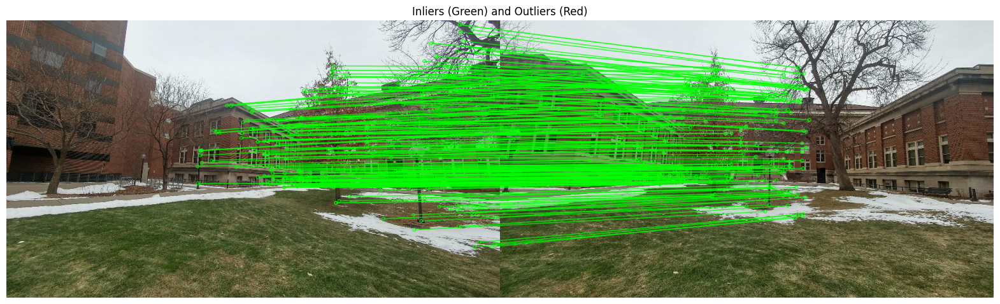

In [130]:
# Optional: Visualize inliers and outliers
def draw_inliers_outliers(img1, kp1, img2, kp2, matches, inliers):
    
    matched_image = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, 
                                    matchColor=(0, 255, 0), singlePointColor=(0, 0, 255),
                                    matchesMask=inliers.ravel().tolist(), flags=2)
    
    plt.figure(figsize=(20,10))
    plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
    plt.title('Inliers (Green) and Outliers (Red)')
    plt.axis('off')
    plt.show()

# Visualize inliers and outliers if homography matrix was computed
if 'inliers' in locals():
    draw_inliers_outliers(img1, keypoints1, img2, keypoints2, [m[0] for m in flann_matches], inliers)
    
# Visualize inliers and outliers for Brute Force matches
if 'bf_inliers' in locals():
    draw_inliers_outliers(img1, keypoints1, img2, keypoints2, bf_matches, bf_inliers)

In [131]:
#Q2.4

# Function to perform perspective warping
def warp_perspective(img1, img2, H):
    # Dimensions of the destination image
    height, width, channels = img1.shape
    
    # Use the homography matrix to warp the perspective of img2
    warped_image = cv2.warpPerspective(img2, H, (width, height))
    
    # Stack both the original and warped images horizontally
    # side_by_side = np.hstack((img1,warped_image,))
    
    return warped_image



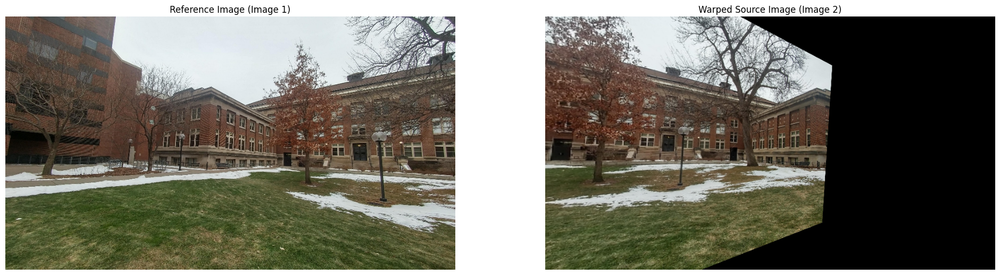

In [132]:
# Apply perspective warping using the homography matrices
warped_bf = warp_perspective(img1, img2, bf_homography_matrix)
warped_flann = warp_perspective(img1, img2, homography_matrix)

# Visualization
plt.figure(figsize=(24, 12))
plt.subplot(121)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Reference Image (Image 1)')
plt.axis('off')


# Display the warped source image (right image)
plt.subplot(122)
plt.imshow(cv2.cvtColor(warped_bf, cv2.COLOR_BGR2RGB))
plt.title('Warped Source Image (Image 2)')
plt.axis('off')

plt.show()

# plt.figure(figsize=(24, 12))
# plt.imshow(cv2.cvtColor(warped_flann, cv2.COLOR_BGR2RGB))
# plt.title('FLANN Warped Perspective')
# plt.axis('off')
# plt.show()


# # Visualization of the perspective warping
# plt.figure(figsize=(20, 10))

# # Display the reference image (left image)
# plt.subplot(121)
# plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
# plt.title('Reference Image (Image 1)')
# plt.axis('off')

# # Display the warped source image (right image)
# plt.subplot(122)
# plt.imshow(cv2.cvtColor(warped_img2, cv2.COLOR_BGR2RGB))
# plt.title('Warped Source Image (Image 2)')
# plt.axis('off')

# plt.tight_layout()
# plt.show()


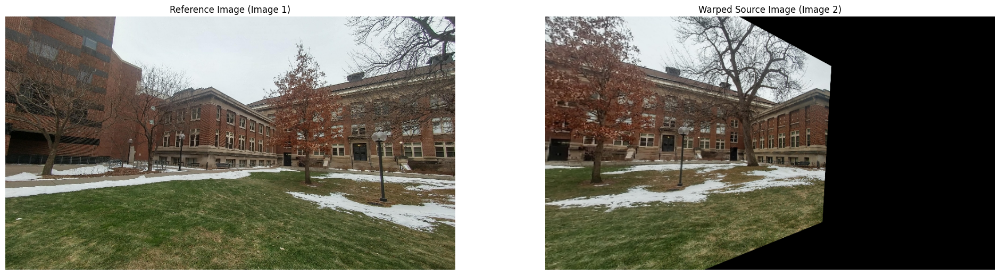

In [133]:
# Visualization
plt.figure(figsize=(24, 12))
plt.subplot(121)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Reference Image (Image 1)')
plt.axis('off')


# Display the warped source image (right image)
plt.subplot(122)
plt.imshow(cv2.cvtColor(warped_flann, cv2.COLOR_BGR2RGB))
plt.title('Warped Source Image (Image 2)')
plt.axis('off')

plt.show()


In [151]:
#Q2.5

def stitch_images_simple(img1, warped_img2):
    stitched_simple = np.hstack((img1, warped_img2))
    return stitched_simple

# def stitch_images_blend_and_crop(img1, warped_img2):
#     height, width = img1.shape[:2]
#     stitched = np.zeros((height, width * 2, 3), dtype=np.uint8)
#     stitched[:, :width] = img1
#     stitched[:, width:width*2] = warped_img2

#     gray = cv2.cvtColor(stitched, cv2.COLOR_BGR2GRAY)
#     _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
#     contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
#     x, y, w, h = cv2.boundingRect(contours[0])
#     cropped = stitched[y:y+h, x:x+w]

#     blend_width = 50
#     start_blend = width - blend_width
#     end_blend = width + blend_width
#     for i in range(start_blend, end_blend):
#         alpha = (i - start_blend) / (end_blend - start_blend)
#         beta = 1.0 - alpha
#         stitched[:, i] = alpha * stitched[:, i] + beta * stitched[:, i - width]

#     return cropped




def stitch_images_blend_and_crop(img1, warped_img2):
    # Determine the new dimensions for the stitched image
    height = max(img1.shape[0], warped_img2.shape[0])
    width = img1.shape[1] + warped_img2.shape[1]

    # Create a blank canvas with the new dimensions
    stitched = np.zeros((height, width, 3), dtype=np.uint8)

    # Place the first image on the left
    stitched[:img1.shape[0], :img1.shape[1]] = img1

    # Place the warped image next to the first image
    stitched[:warped_img2.shape[0], img1.shape[1]:img1.shape[1]+warped_img2.shape[1]] = warped_img2

    # Convert to grayscale to find contours for cropping to the combined area
    gray = cv2.cvtColor(stitched, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x, y, w, h = cv2.boundingRect(contours[0])

    # Crop to the bounding rectangle to remove all black borders
    cropped = stitched[y:y+h, x:x+w]

    # Define the width of the blending zone and ensure it's within the cropped dimensions
    blend_width = 50
    start_blend = max(0, img1.shape[1] - blend_width)
    end_blend = min(cropped.shape[1], img1.shape[1] + blend_width)

    # Perform blending between the two images
    for i in range(start_blend, end_blend):
        alpha = (i - start_blend) / (end_blend - start_blend)
        beta = 1.0 - alpha
        if i < cropped.shape[1]:  # Check to avoid 'IndexError'
            cropped[:, i] = alpha * cropped[:, i] + beta * cropped[:, i - img1.shape[1] + start_blend]

    return cropped


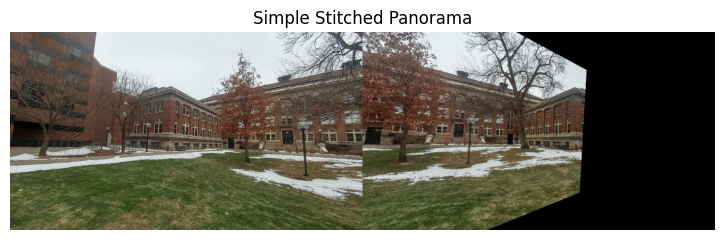

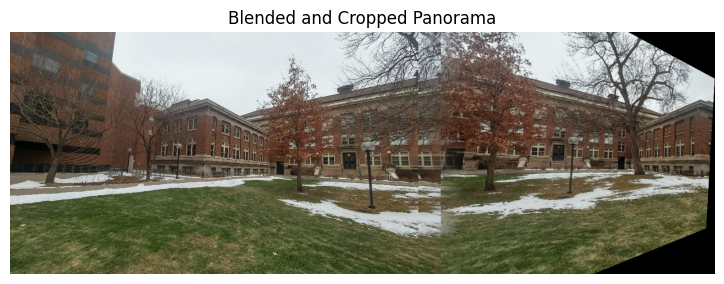

In [152]:
stitched_simple = stitch_images_simple(img1, warped_flann)
stitched_blend_crop = stitch_images_blend_and_crop(img1, warped_flann)

# Display results
plt.figure(figsize=(20, 24))
plt.subplot(121)
plt.imshow(cv2.cvtColor(stitched_simple, cv2.COLOR_BGR2RGB))
plt.title('Simple Stitched Panorama')
plt.axis('off')
plt.show

plt.figure(figsize=(20, 24))
plt.subplot(122)
plt.imshow(cv2.cvtColor(stitched_blend_crop, cv2.COLOR_BGR2RGB))
plt.title('Blended and Cropped Panorama')
plt.axis('off')
plt.show()

In [145]:
#Q2.6



In [157]:
def flann_matching(descriptors1, descriptors2):
    # Ensure descriptors are float32 type
    if descriptors1.dtype != np.float32:
        descriptors1 = descriptors1.astype(np.float32)
    if descriptors2.dtype != np.float32:
        descriptors2 = descriptors2.astype(np.float32)

    index_params = dict(algorithm=1, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(descriptors1, descriptors2, k=2)

    # Filter matches using the Lowe's ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)
    return good_matches



def compute_homography(matches, kp1, kp2):
    if len(matches) < 4:
        return None, None  # Not enough points

    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)

    for i, match in enumerate(matches):
        points1[i, :] = kp1[match.queryIdx].pt  # queryIdx of keypoints in img1
        points2[i, :] = kp2[match.trainIdx].pt  # trainIdx of keypoints in img2

    H, mask = cv2.findHomography(points1, points2, cv2.RANSAC)
    return H, mask





Not enough matches found between image 5 and the panorama. Only 1 matches found.
Not enough matches found between image 6 and the panorama. Only 2 matches found.
Not enough matches found between image 7 and the panorama. Only 2 matches found.


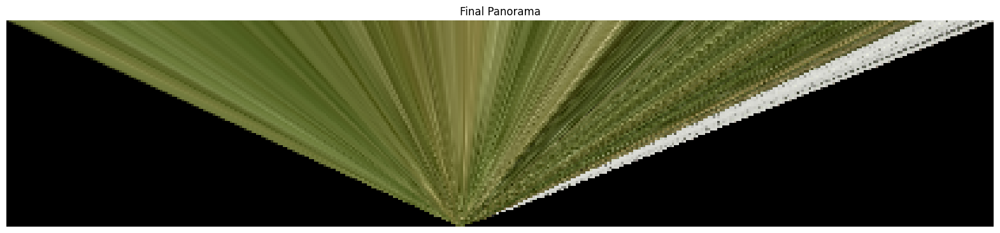

In [158]:
def load_images_from_folder(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Warning: Image {filename} could not be loaded.")
            continue
        images.append(img)
    return images


def multi_image_stitching(images):
    if not images:
        raise ValueError("No images to stitch")

    current_panorama = images[0]
    for i in range(1, len(images)):
        img1 = current_panorama
        img2 = images[i]

        gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
        gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

        keypoints1, descriptors1 = apply_sift(gray1)
        keypoints2, descriptors2 = apply_sift(gray2)

        matches = flann_matching(descriptors1, descriptors2)
        if len(matches) < 10:  # Ensuring there are enough matches to proceed
            print(f"Not enough matches found between image {i} and the panorama. Only {len(matches)} matches found.")
            continue

        homography, _ = compute_homography(matches, keypoints1, keypoints2)
        if homography is None:
            print("Homography computation failed for image", i)
            continue

        warped_img2 = cv2.warpPerspective(img2, homography, (img1.shape[1] + img2.shape[1], img1.shape[0]))
        current_panorama = stitch_images_blend_and_crop(img1, warped_img2)

    return current_panorama



folder_path = './panaroma_generation'  # Make sure this is your folder path
all_images = load_images_from_folder(folder_path)
final_panorama = multi_image_stitching(all_images)

plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(final_panorama, cv2.COLOR_BGR2RGB))
plt.title('Final Panorama')
plt.axis('off')
plt.show()

Homography computation failed.
Homography computation failed.


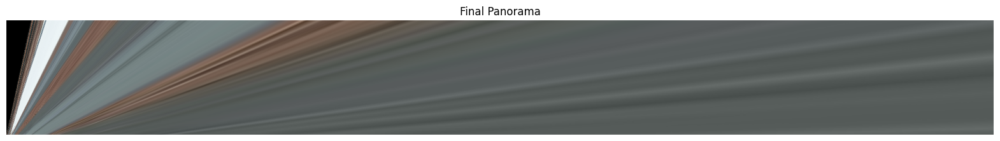

In [159]:
import cv2
import numpy as np
import os
from matplotlib import pyplot as plt

def load_images_from_folder(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
    return images

def apply_sift(gray_img):
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray_img, None)
    return keypoints, descriptors

def flann_matching(descriptors1, descriptors2):
    index_params = dict(algorithm=1, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(descriptors1, descriptors2, k=2)
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)  # Fixed: append 'm' directly
    return good_matches

def compute_homography(matches, kp1, kp2):
    if not matches:
        return None, None  # Handle no matches case
    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)
    for i, match in enumerate(matches):
        points1[i, :] = kp1[match.queryIdx].pt
        points2[i, :] = kp2[match.trainIdx].pt
    H, mask = cv2.findHomography(points1, points2, cv2.RANSAC)
    return H, mask

def stitch_images_blend_and_crop(img1, warped_img2):
    height = max(img1.shape[0], warped_img2.shape[0])
    width = img1.shape[1] + warped_img2.shape[1]
    stitched = np.zeros((height, width, 3), dtype=np.uint8)
    stitched[:img1.shape[0], :img1.shape[1]] = img1
    stitched[:warped_img2.shape[0], img1.shape[1]:img1.shape[1]+warped_img2.shape[1]] = warped_img2
    gray = cv2.cvtColor(stitched, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x, y, w, h = cv2.boundingRect(contours[0])
    cropped = stitched[y:y+h, x:x+w]
    return cropped

def multi_image_stitching(images):
    current_panorama = images[0]
    for i in range(1, len(images)):
        img1 = current_panorama
        img2 = images[i]
        gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
        gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
        keypoints1, descriptors1 = apply_sift(gray1)
        keypoints2, descriptors2 = apply_sift(gray2)
        matches = flann_matching(descriptors1, descriptors2)
        if matches:
            homography, _ = compute_homography(matches, keypoints1, keypoints2)
            if homography is not None:
                warped_img2 = cv2.warpPerspective(img2, homography, (img1.shape[1] + img2.shape[1], img1.shape[0]))
                current_panorama = stitch_images_blend_and_crop(img1, warped_img2)
            else:
                print("Homography computation failed.")
        else:
            print(f"Not enough matches found between image {i} and the panorama.")
    return current_panorama

folder_path = './panaroma_generation'  # Make sure this is your folder path
all_images = load_images_from_folder(folder_path)
final_panorama = multi_image_stitching(all_images)

plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(final_panorama, cv2.COLOR_BGR2RGB))
plt.title('Final Panorama')
plt.axis('off')
plt.show()
